In [0]:
from google.colab import drive

drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [0]:
project_path = "/content/drive/My Drive/Capstone_Project/Ticket_Assignment/input_data.xlsx"

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
pip install wordcloud

In [0]:
from wordcloud import WordCloud

In [0]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [0]:
stops = set(stopwords.words("english"))

In [0]:
data = pd.read_excel(project_path)

In [0]:
data.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [0]:
data = data.rename(columns={"Short description":"srt_desc","Description":"desc","Caller":"caller","Assignment group":"group"})

In [0]:
data.head()

,srt_desc,desc,caller,group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


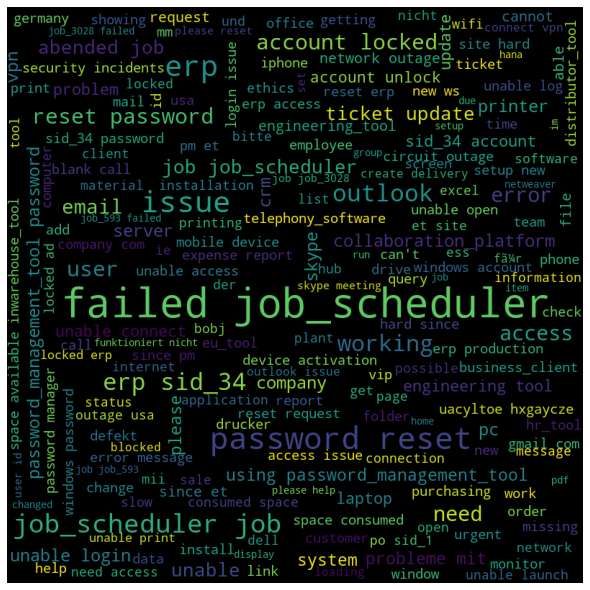

In [0]:
srt_desc_comment_words = '' 
for val in data.srt_desc: 
      
    val = str(val) 
   
    tokens = val.split() 
      
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    srt_desc_comment_words += " ".join(tokens)+" "

 
wordcloud_srt_desc = WordCloud(width = 800, height = 800, 
                stopwords = stops, 
                min_font_size = 10).generate(srt_desc_comment_words) 
                          
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_srt_desc) 
plt.axis("off") 
plt.margins(x=0,y=0)
plt.tight_layout(pad = 0) 
  
plt.show() 

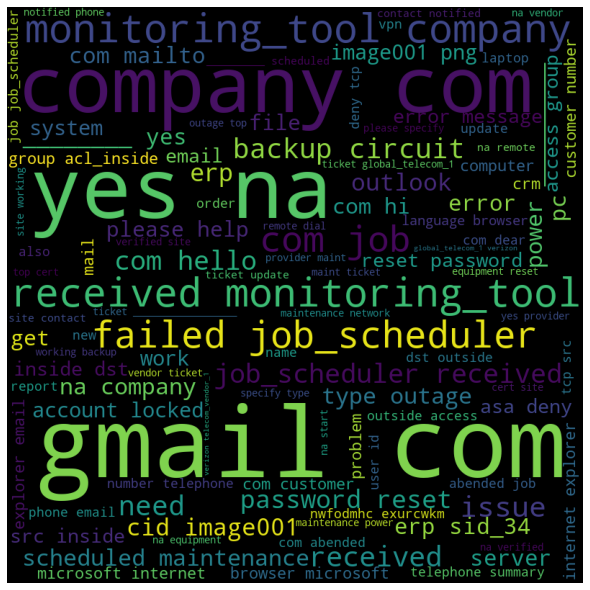

In [0]:
desc_comment_words = '' 
for val in data.desc: 
       
    val = str(val) 
   
    tokens = val.split() 
       
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    desc_comment_words += " ".join(tokens)+" "

wordcloud_desc = WordCloud(width = 800, height = 800, 
                stopwords = stops, 
                min_font_size = 10).generate(desc_comment_words) 
                          
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_desc) 
plt.axis("off") 
plt.margins(x=0,y=0)
plt.tight_layout(pad = 0) 
  
plt.show() 

In [0]:
data.desc[0]

'-verified user details.(employee# & manager name)\n-checked the user name in ad and reset the password.\n-advised the user to login and check.\n-caller confirmed that he was able to login.\n-issue resolved.'

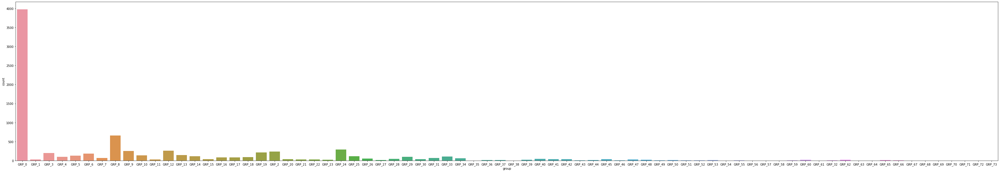

In [0]:
plt.figure(figsize=(60,10))
sns.countplot(data.group)
plt.show()

In [0]:
pd.DataFrame(data.group.value_counts()).head(50)

,group
GRP_0,3976
GRP_8,661
GRP_24,289
GRP_12,257
GRP_9,252
GRP_2,241
GRP_19,215
GRP_3,200
GRP_6,184
GRP_13,145


In [0]:
data.describe()

,srt_desc,desc,caller,group
count,8492,8499,8500,8500
unique,7481,7814,2950,74
top,password reset,the,bpctwhsn kzqsbmtp,GRP_0
freq,38,56,810,3976


In [0]:
data.isnull().sum()

srt_desc    8
desc        1
caller      0
group       0
dtype: int64

In [0]:
def fillna():
  for i in data.index:
    if pd.isna(data.iloc[i,0]) and pd.isna(data.iloc[i,1]):
      data.drop(data.index[i])
    elif pd.isna(data.iloc[i,0]):
      data.iloc[i,0] = data.iloc[i,1]
    elif pd.isna(data.iloc[i,1]):
      data.iloc[i,1] = data.iloc[i,0]

In [0]:
fillna()

In [0]:
data.isnull().sum()

srt_desc    0
desc        0
caller      0
group       0
dtype: int64

In [0]:
data.head()

,srt_desc,desc,caller,group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [0]:
  import re

In [0]:
data_final_re = data.copy()

In [0]:
non_alnum = []
for col1 in data_final_re.index:
  for w in data_final_re["desc"][col1]:
    if not w.isalnum():
      if w not in non_alnum:
        non_alnum.append(w)
        #print(str(w))
print(non_alnum)        

['-', ' ', '.', '(', '#', '&', ')', '\n', ':', '@', ',', '/', '?', '_', '[', "'", ']', '*', '<', '!', '"', '>', '=', ';', '$', '\\', '%', '€', '¦', '˜', '+', '„', '…', '‚', '°', '†', '’', '¤', '›', '®', '»', '¶', '¬', '¯', '\x81', '‡', '¥', '”', '¿', '¨', '¸', '\xad', '\x8f', '\x90', '«', '•', '‹', '¡', '‰', '\x9d', '¢', '™', '–', '\xa0', '‘', '\x8d', '·', '´', '±', '~', '“', '©', '|', '§', '—', '£', '`', '{', '}', '^']


In [0]:
contractions = { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"I'd": "I had / I would",
"I'd've": "I would have",
"I'll": "I shall / I will",
"I'll've": "I shall have / I will have",
"I'm": "I am",
"I've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

In [0]:
def clean_data(text,remove_stopwords = True):
  text1 = text.lower()
  text1 = text1.split()
  new_text=[]
  for w in text1:
    if w in contractions:
      new_text.append(contractions[w])
    else:
      new_text.append(w)
    text1 = " ".join(new_text)
    text1 = re.sub(r'[´`^]', '', text1, flags=re.MULTILINE)
    text1 = re.sub(r'[_]', ' ', text1)
    text1 = re.sub(r'[\\]', '', text1)
    text1 = re.sub(r'[][]', ' ', text1)
    text1 = re.sub(r'[^a-zA-Z0-9]', ' ', text1)    
    if remove_stopwords:  
      text1 = text1.split()
      text1 = [w for w in text1 if not w in stops]
      text1 = " ".join(text1)
  if len(text1) > 0:
    text1 = re.sub(r' +', ' ', text1)
  return text1

In [0]:
def combine_desc(srt_desc_text,desc_text,caller_text):
  whole_desc = ""
  srt_desc = clean_data(srt_desc_text,True)
  desc = clean_data(desc_text,True)
  call_text = clean_data(caller_text,True)
  if srt_desc == desc:
    whole_desc = (" ".join((str(desc),str(call_text))))
  elif str(srt_desc) in str(desc):
    whole_desc = (" ".join((str(srt_desc), str(desc.replace(srt_desc,'')),str(call_text))))
  else:
    whole_desc = (" ".join((str(srt_desc), str(desc),str(call_text))))
  return whole_desc

In [0]:
complete_desc = []
for i in data_final_re.index:
  complete_desc.append(combine_desc(data_final_re.srt_desc[i],data_final_re.desc[i],data_final_re.caller[i]))

In [0]:
len(complete_desc)

8500

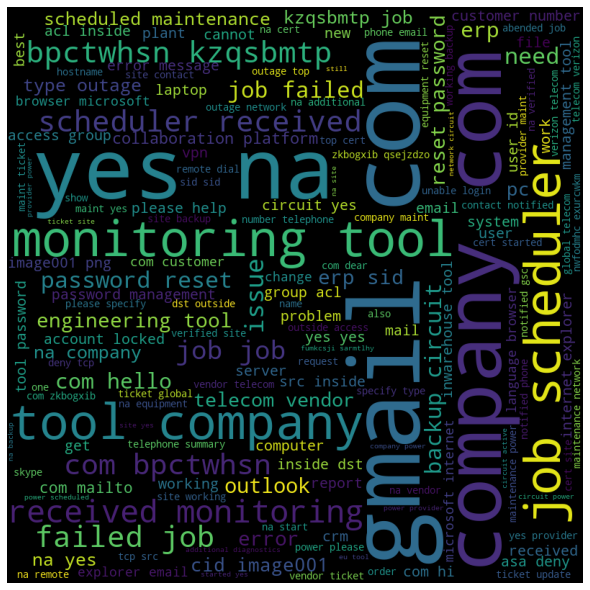

In [0]:
complete_desc_comment_words = '' 
for val in complete_desc: 
       
    val = str(val) 
   
    tokens = val.split() 
       
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    complete_desc_comment_words += " ".join(tokens)+" "

wordcloud_desc = WordCloud(width = 800, height = 800, 
                stopwords = stops, 
                min_font_size = 10).generate(complete_desc_comment_words) 
                          
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud_desc) 
plt.axis("off") 
plt.margins(x=0,y=0)
plt.tight_layout(pad = 0) 
  
plt.show() 

In [0]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

In [0]:
label = LabelEncoder()
y = label.fit_transform(data_final_re.group)
y_fit = label.fit(data_final_re.group)

In [0]:
y_fit.classes_

array(['GRP_0', 'GRP_1', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_3', 'GRP_30',
       'GRP_31', 'GRP_32', 'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36',
       'GRP_37', 'GRP_38', 'GRP_39', 'GRP_4', 'GRP_40', 'GRP_41',
       'GRP_42', 'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47',
       'GRP_48', 'GRP_49', 'GRP_5', 'GRP_50', 'GRP_51', 'GRP_52',
       'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56', 'GRP_57', 'GRP_58',
       'GRP_59', 'GRP_6', 'GRP_60', 'GRP_61', 'GRP_62', 'GRP_63',
       'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69',
       'GRP_7', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73', 'GRP_8', 'GRP_9'],
      dtype=object)

In [0]:
onehot_encoder = OneHotEncoder(sparse=False)
y = y.reshape(len(y), 1)
y_encoded = onehot_encoder.fit_transform(y)

In [0]:
print("Features Data:")
print(complete_desc[43])
print("Group no : ",data_final_re.group[43])
print("Label Data:")
print(y_encoded[43])

Features Data:
please reroute jobs printer01 printer02 issue needs resolved today received yisohglr uvteflgb gmail com hi printer01 printer working needs part replaced reroute jobs queue printer printer02 wihuyjdo qpogfwkb indicated prqos001 needs new part may deliver days inwarehouse tools need print printer02 needs taken care today since inwarehouse tools printed picked outside vendor 2 30 pm usa daily basis please contact dkmcfreg anwmfvlgenkataramdntyana questions jobs queue today yisohglr uvteflgb
Group no :  GRP_5
Label Data:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]


In [0]:
no_of_groups = data_final_re["group"].nunique()

In [0]:
def count(elements): 
    # check if each word has '.' at its last. If so then ignore '.' 
    if elements[-1] == '.': 
        elements = elements[0:len(elements) - 1] 
   
    # if there exists a key as "elements" then simply 
    # increase its value. 
    if elements in word_freq: 
        word_freq[elements] += 1
   
    # if the dictionary does not have the key as "elements"  
    # then create a key "elements" and assign its value to 1. 
    else: 
        word_freq.update({elements: 1})

In [0]:
word_group = {}
word_freq = {} 

for val in complete_desc:
  word_list = []
  # typecaste each val to string 
  val = str(val) 
    #val = val.replace(concat_seperation,' ')
    # split the value 
  tokens = val.split() 
      
    # Converts each token into lowercase 
  for i in range(len(tokens)): 
    if tokens[i] not in stops:
      count(tokens[i])
      word_list.append(tokens[i])
  
  word_group[num] = word_list

In [0]:
max_len = max([len(str(r).split()) for r in complete_desc])

In [0]:
max_len

2016

In [0]:
no_words = []
for val in complete_desc:
  no_words.append(len(str(val).split()))


In [0]:
max_features = 20000
max_len = 500

In [0]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

In [0]:
tokenizer = Tokenizer(num_words=max_features)

tokenizer.fit_on_texts(complete_desc)

seq = tokenizer.texts_to_sequences(complete_desc)

In [0]:
print(complete_desc[0])
seq[0]

login issue verified user details employee manager name checked user name ad reset password advised user login check caller confirmed able  resolved spxjnwir pjlcoqds


[48,
 19,
 204,
 14,
 199,
 231,
 102,
 37,
 405,
 14,
 37,
 321,
 18,
 10,
 612,
 14,
 48,
 96,
 392,
 314,
 67,
 298,
 13358,
 13359]

In [0]:
X = pad_sequences(seq, maxlen = max_len)

In [0]:
print(tokenizer.word_index)

{'com': 1, 'company': 2, 'job': 3, 'received': 4, 'tool': 5, 'gmail': 6, 'please': 7, 'yes': 8, 'na': 9, 'password': 10, 'erp': 11, '1': 12, '2016': 13, 'user': 14, '00': 15, 'access': 16, '10': 17, 'reset': 18, 'issue': 19, 'sid': 20, 'ticket': 21, 'monitoring': 22, 'scheduler': 23, 'unable': 24, 'failed': 25, 'error': 26, '2': 27, 'email': 28, 'bpctwhsn': 29, 'kzqsbmtp': 30, 'account': 31, 'site': 32, 'hostname': 33, 'help': 34, '08': 35, 'circuit': 36, 'name': 37, 'working': 38, '09': 39, 'system': 40, 'power': 41, 'outlook': 42, 'id': 43, 'network': 44, 'hello': 45, '16': 46, 'need': 47, 'login': 48, '4': 49, 'vendor': 50, '34': 51, 'backup': 52, '0': 53, 'cannot': 54, 'cid': 55, 'telecom': 56, 'message': 57, 'event': 58, '3': 59, 'outage': 60, 'server': 61, 'phone': 62, 'new': 63, 'see': 64, 'type': 65, '23': 66, 'able': 67, '11': 68, 'inside': 69, 'usa': 70, '13': 71, 'hi': 72, 'team': 73, 'vpn': 74, '5': 75, '12': 76, 'crm': 77, 'engineering': 78, '8': 79, 'number': 80, '7': 81,

In [0]:
X[0]

array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,

In [0]:
for i in data_final_re.index:
  data_final_re.iloc[i,0] = re.sub(r'[´`]','',data_final_re.iloc[i,0])    
  data_final_re.iloc[i,0] = re.sub(r'[_^]',' ',data_final_re.iloc[i,0])
  data_final_re.iloc[i,0] = re.sub(r'[\\]','',data_final_re.iloc[i,0])
  data_final_re.iloc[i,0] = re.sub(r'[][]',' ',data_final_re.iloc[i,0])
  data_final_re.iloc[i,0] = re.sub(r'[^a-zA-z0-9]',' ',data_final_re.iloc[i,0])
  data_final_re.iloc[i,0] = re.sub(r' +',' ',data_final_re.iloc[i,0])  
  data_final_re.iloc[i,1] = re.sub(r'[´`^]','',data_final_re.iloc[i,1])
  data_final_re.iloc[i,1] = re.sub(r'[_^]',' ',data_final_re.iloc[i,1])
  data_final_re.iloc[i,1] = re.sub(r'[\\]','',data_final_re.iloc[i,1])
  data_final_re.iloc[i,1] = re.sub(r'[][]','',data_final_re.iloc[i,1])
  data_final_re.iloc[i,1] = re.sub(r'[^a-zA-z0-9]',' ',data_final_re.iloc[i,1])
  data_final_re.iloc[i,1] = re.sub(r' +',' ',data_final_re.iloc[i,1])

In [0]:
data_final_re['srt_desc'] = data_final_re['srt_desc'].str.lower()
data_final_re['desc'] = data_final_re['desc'].str.lower()

In [0]:
data_final_re["whole_desc"] = np.nan

for i in data_final_re.index:
  if data_final_re.iloc[i,0] == data_final_re.iloc[i,1]:
    data_final_re.iloc[i,4] = data_final_re.iloc[i,0]
  elif str(data_final_re.iloc[i,0]) in str(data_final_re.iloc[i,1]):
    data_final_re.iloc[i,4] = data_final_re.iloc[i,0] + ' ' + data_final_re.iloc[i,1].replace(data_final_re.iloc[i,0],'')
  else:
    data_final_re.iloc[i,4] = data_final_re.iloc[i,0] + ' ' + data_final_re.iloc[i,1]

In [0]:
non_alnum = []
for col1 in data_final_re.index:
  for w in data_final_re["whole_desc"][col1]:
    if not w.isalnum():
      if w not in non_alnum:
        non_alnum.append(w)
        #print(str(w))

In [0]:
non_alnum

[' ']

In [0]:
data_final_re.head(50)

,srt_desc,desc,caller,group,whole_desc
0,login issue,verified user details employee manager name c...,spxjnwir pjlcoqds,0,login issue verified user details employee ma...
1,outlook,received from hmjdrvpb komuaywn gmail com hel...,hmjdrvpb komuaywn,0,outlook received from hmjdrvpb komuaywn gmail...
2,cant log in to vpn,received from eylqgodm ybqkwiam gmail com hi ...,eylqgodm ybqkwiam,0,cant log in to vpn received from eylqgodm ybq...
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,0,unable to access hr tool page
4,skype error,skype error,owlgqjme qhcozdfx,0,skype error
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,0,unable to log in to engineering tool and skype
6,event critical hostname 221 company com the va...,event critical hostname 221 company com the va...,jyoqwxhz clhxsoqy,1,event critical hostname 221 company com the va...
7,ticket no1550391 employment status new non emp...,ticket no1550391 employment status new non emp...,eqzibjhw ymebpoih,0,ticket no1550391 employment status new non emp...
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,0,unable to disable add ins on outlook
9,ticket update on inplant 874773,ticket update on inplant 874773,fumkcsji sarmtlhy,0,ticket update on inplant 874773


In [0]:
print(data_final_re.iloc[6,0])
print(data_final_re.iloc[6,1])
print(data_final_re.iloc[6,2])
print(data_final_re.iloc[6,3])
print(data_final_re.iloc[6,4])

event critical hostname 221 company com the value of mountpoint threshold for oracle sid 37 erpdata21 
event critical hostname 221 company com the value of mountpoint threshold for oracle sid 37 erpdata21 sr3psa1d 7 sr3psa1d data7 perpsr3psa1d 4524 is 98
jyoqwxhz clhxsoqy
1
event critical hostname 221 company com the value of mountpoint threshold for oracle sid 37 erpdata21  sr3psa1d 7 sr3psa1d data7 perpsr3psa1d 4524 is 98


In [0]:
no_of_groups = data_final_re["group"].nunique()

In [0]:
stopwords = set(STOPWORDS) 

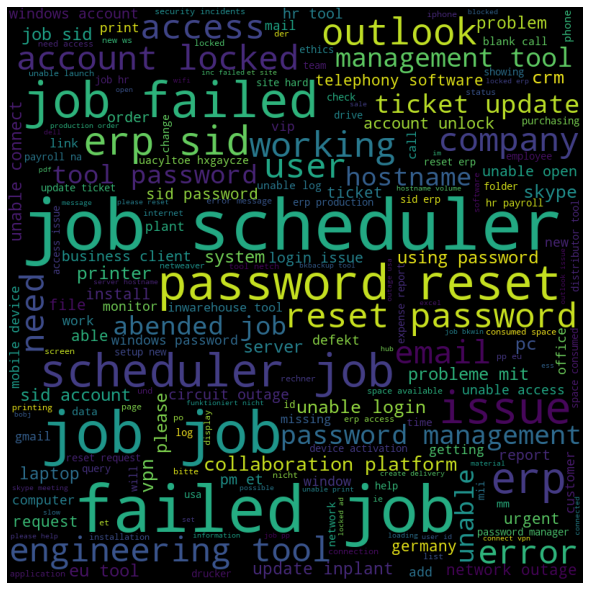

In [0]:
srt_desc_comment_words = '' 
for val in data_final_re.srt_desc: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    srt_desc_comment_words += " ".join(tokens)+" "

 
wordcloud = WordCloud(width = 800, height = 800, 
                stopwords = stopwords, 
                min_font_size = 10).generate(srt_desc_comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.margins(x=0,y=0)
plt.tight_layout(pad = 0) 
  
plt.show() 

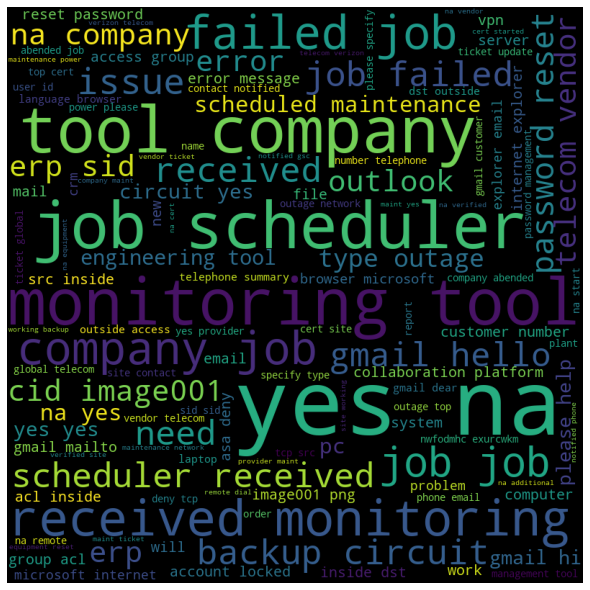

In [0]:
desc_comment_words = '' 
for val in data_final_re.desc: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    desc_comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                stopwords = stopwords, 
                min_font_size = 10).generate(desc_comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.margins(x=0,y=0)
plt.tight_layout(pad = 0) 
  
plt.show() 

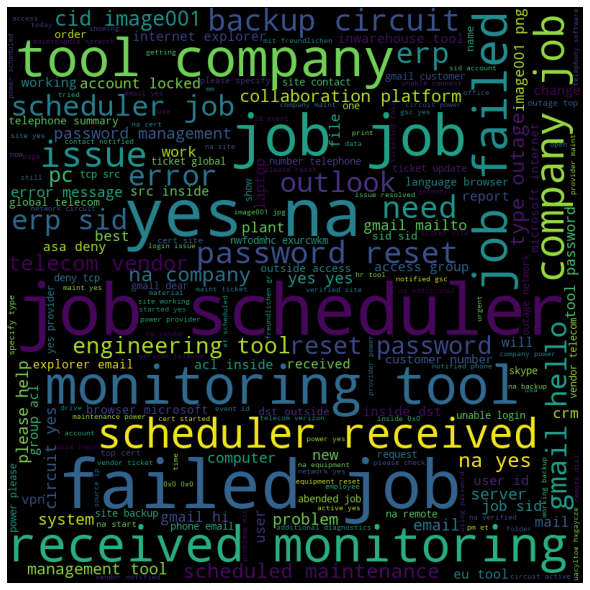

In [0]:
whole_desc_comment_words = '' 
for val in data_final_re.whole_desc: 
      
    # typecaste each val to string 
    val = str(val) 
    #val = val.replace(concat_seperation,' ')
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    whole_desc_comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                stopwords = stopwords, 
                min_font_size = 10).generate(whole_desc_comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.margins(x=0,y=0)
plt.tight_layout(pad = 0) 
  
plt.show() 

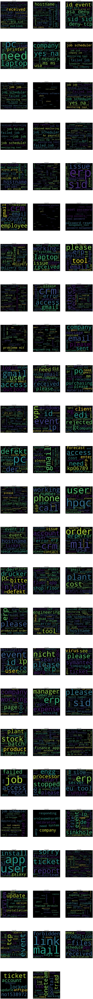

In [0]:
plt.figure(figsize=(25,280))
j = np.ceil(no_of_groups/3)
for r in range(no_of_groups):

  data_group = data_final_re[data_final_re["group"]==str(r)]
  whole_desc_comment_group_wise = ''
  for val in data_group.whole_desc:
         
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    whole_desc_comment_group_wise += " ".join(tokens)+" "
  
  wordcloud = WordCloud(width = 400, height = 400, 
                stopwords = stopwords, 
                min_font_size = 10).generate(whole_desc_comment_group_wise) 
  # plot the WordCloud image                        
  t=r+1
  plt.subplot(j, 3, t).set_title("Group #" + str(r))
  plt.imshow(wordcloud)
  plt.axis("off") 

plt.show() 

In [0]:
def count(elements): 
    # check if each word has '.' at its last. If so then ignore '.' 
    if elements[-1] == '.': 
        elements = elements[0:len(elements) - 1] 
   
    # if there exists a key as "elements" then simply 
    # increase its value. 
    if elements in word_freq: 
        word_freq[elements] += 1
   
    # if the dictionary does not have the key as "elements"  
    # then create a key "elements" and assign its value to 1. 
    else: 
        word_freq.update({elements: 1})

In [0]:
word_group = {}
word_freq = {} 
for num in range(no_of_groups):
  data_group = data_final_re[data_final_re["group"]==str(num)]

  word_list = []
  for val in data_group.whole_desc:
    # typecaste each val to string 
    val = str(val) 
    #val = val.replace(concat_seperation,' ')
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
      if tokens[i] not in stopwords:
        count(tokens[i])
        word_list.append(tokens[i])
    
  word_group[num] = word_list


In [0]:
{k: v for k, v in sorted(word_freq.items(), reverse=True,key=lambda item: item[1])}

{'job': 4655,
 'company': 2604,
 'tool': 2414,
 'received': 2376,
 '00': 2243,
 '2016': 2238,
 'gmail': 2160,
 'please': 2070,
 'yes': 2027,
 'na': 1997,
 'scheduler': 1773,
 'password': 1748,
 'failed': 1721,
 'erp': 1641,
 '10': 1566,
 '1': 1551,
 'user': 1324,
 'access': 1251,
 'sid': 1189,
 'reset': 1136,
 'issue': 1099,
 '09': 1047,
 'ticket': 1000,
 'monitoring': 993,
 '08': 952,
 'unable': 951,
 'error': 903,
 '2': 896,
 'email': 817,
 'account': 809,
 'site': 800,
 'hostname': 788,
 'help': 729,
 'circuit': 697,
 'name': 696,
 'working': 695,
 'system': 679,
 'outlook': 669,
 'power': 669,
 '16': 665,
 'id': 663,
 'network': 639,
 'hello': 631,
 'need': 626,
 'login': 613,
 's': 609,
 '4': 590,
 'vendor': 582,
 '23': 558,
 '34': 545,
 't': 524,
 '11': 519,
 'backup': 512,
 '0': 499,
 'telecom': 485,
 'message': 475,
 'cid': 475,
 '3': 467,
 'outage': 467,
 'server': 461,
 '13': 461,
 'phone': 451,
 '12': 449,
 'event': 449,
 'new': 447,
 'see': 444,
 'type': 442,
 'able': 440,


In [0]:
  max_len = max([len(r.split()) for r in data_final_re["whole_desc"]])

In [0]:
max_features = 20000

In [0]:
no_words = []
for val in data_final_re.whole_desc:
  no_words.append(len(val.split()))

In [0]:
sorted(no_words,reverse=True)

[2144,
 1776,
 1776,
 1756,
 1756,
 1706,
 1629,
 1581,
 1581,
 1491,
 1478,
 1439,
 1436,
 1436,
 1414,
 1362,
 1302,
 947,
 935,
 908,
 717,
 703,
 679,
 645,
 625,
 609,
 603,
 549,
 534,
 507,
 496,
 477,
 473,
 469,
 462,
 433,
 430,
 414,
 406,
 404,
 396,
 369,
 350,
 344,
 318,
 310,
 307,
 302,
 295,
 291,
 291,
 288,
 287,
 287,
 277,
 266,
 264,
 263,
 260,
 258,
 247,
 242,
 236,
 235,
 231,
 229,
 228,
 228,
 225,
 223,
 221,
 221,
 220,
 217,
 215,
 215,
 215,
 213,
 210,
 209,
 207,
 207,
 207,
 207,
 206,
 206,
 205,
 204,
 203,
 203,
 203,
 203,
 203,
 203,
 199,
 198,
 197,
 197,
 197,
 196,
 195,
 193,
 193,
 192,
 192,
 192,
 190,
 189,
 188,
 187,
 184,
 184,
 184,
 183,
 182,
 182,
 182,
 181,
 181,
 180,
 180,
 179,
 177,
 176,
 176,
 175,
 175,
 175,
 175,
 174,
 173,
 173,
 171,
 171,
 170,
 170,
 170,
 170,
 170,
 170,
 169,
 169,
 169,
 169,
 169,
 168,
 168,
 168,
 168,
 168,
 168,
 168,
 168,
 168,
 167,
 167,
 167,
 167,
 167,
 167,
 167,
 166,
 166,
 166,

In [0]:
max_len = 500

In [0]:
X = data_final_re["whole_desc"]
y = data_final_re["group"]

In [0]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

In [0]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.3,random_state=10)

In [0]:
tokenizer = Tokenizer(num_words=max_features)

In [0]:
tokenizer.fit_on_texts(data_final_re["whole_desc"])

In [0]:
seq = tokenizer.texts_to_sequences(data_final_re['whole_desc'])

In [0]:
seq[0]

[74,
 38,
 273,
 34,
 270,
 300,
 155,
 64,
 488,
 2,
 34,
 64,
 4,
 399,
 11,
 37,
 2,
 26,
 708,
 2,
 34,
 1,
 74,
 11,
 145,
 476,
 387,
 54,
 209,
 76,
 107,
 1,
 369]

In [0]:
X = pad_sequences(seq, maxlen = max_len)

In [0]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

In [0]:
y = []
for val in data_final_re.group:
  y.append(val)

In [0]:
lab_enc = LabelEncoder()
y_train = lab_enc.fit_transform(y)

In [0]:
onehot_encoder = OneHotEncoder(sparse=False)
y = y.reshape(len(y), 1)
y_encoded = onehot_encoder.fit_transform(y)

AttributeError: ignored

In [0]:
print(X[43])
print("Features Data:")
print("Label Data:")
print(y_encoded[17])

Features Data:
please reroute jobs on printer01 to printer02 issue needs to be resolved today  received from yisohglr uvteflgb gmail com hi the printer01 printer is not working and needs a part replaced can you reroute the jobs in queue to printer printer02 wihuyjdo qpogfwkb has indicated that prqos001 needs a new part and it may not deliver for a few days so the inwarehouse tools will need to print on printer02 for now this needs to be taken care of today since the inwarehouse tools are printed and are picked up by an outside vendor at 2 30 pm in usa on a daily basis please contact dkmcfreg anwmfvlgenkataramdntyana if you have questions about the jobs in queue for today 
Label Data:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
